# Vision Transformers vs CNNs sur "CLEVR Reasoning Tasks"

Ce notebook compare les performances et l'interprétabilité des Vision Transformers (ViT-B/16) et des Convolutional Neural Networks (ResNet-50) sur des tâches de raisonnement visuel du dataset CLEVR.

---

## Tasks Overview

Nous avons conçu quatre tâches de complexité croissante pour évaluer la capacité de raisonnement spatial des modèles. Dans chaque cas, le modèle doit prédire la **couleur** d'un objet cible parmi 8 couleurs possibles.

**Tâche 1 : Distance simple**  
"Quelle est la couleur du cylindre le plus loin de la caméra ?"  
→ Nécessite de comparer les positions en profondeur et identifier une forme spécifique.

**Tâche 2 : Distance relative**  
"Quelle est la couleur de l'objet le plus éloigné de la sphère grise ?"  
→ Nécessite de localiser un objet ancre (sphère grise) puis calculer les distances relatives à tous les autres objets.

**Tâche 3 : Raisonnement en deux étapes**  
A → B → C  
- Trouve la Sphère Grise  
- Regarde quel est l'objet le plus PROCHE d'elle  
- Quelle est la couleur de l'objet le plus LOIN de ce voisin ?  

→ Nécessite un raisonnement séquentiel avec deux calculs de distance successifs.

**Tâche 4 : Raisonnement multi-attributs**  
A $\xrightarrow{\text{material}}$ B $\xrightarrow{\text{shape}}$ C  
- Trouve la Sphère Grise  
- Identifie son MATÉRIAU (Métal ou Rubber)  
- Trouve le CYLINDRE fait du MÊME MATÉRIAU  
- Quelle est la couleur de l'objet le plus PETIT à côté de ce cylindre ?  

→ Nécessite de raisonner sur plusieurs attributs (forme, matériau, taille) et relations spatiales.

Ces tâches requièrent un **raisonnement global** et la compréhension de **relations spatiales complexes**, ce qui devrait favoriser le mécanisme d'attention du ViT par rapport aux champs récepteurs locaux des CNNs.

Dans ce projet, nous nous concentrons sur les **Tâches 2 et 3** car elles impliquent un raisonnement plus sophistiqué que la simple distance à la caméra de la Tâche 1. La tâche 4 est laissé de côté car les modèles n'ont pas montré de performances significatives sur cette tâche complexe.

---

## Préparation des données

Le dataset CLEVR contient des scènes 3D synthétiques avec des questions en langage naturel. Chaque image contient plusieurs objets géométriques (cubes, sphères, cylindres) avec différents attributs (couleur, taille, matériau).

Pour nos expériences, nous avons extrait et préparé les données avec des scripts `prepare_data_task_i.py` qui génèrent des fichiers JSON mappant chaque tâche à un label de couleur parmi :

```python
['gray', 'red', 'blue', 'green', 'brown', 'purple', 'cyan', 'yellow']
```

Ces fichiers JSON sont ensuite utilisés par le dataloader pour l'entraînement et l'évaluation.


Exemple de scène: CLEVR_train_000000.png
Nombre d'objets: 6



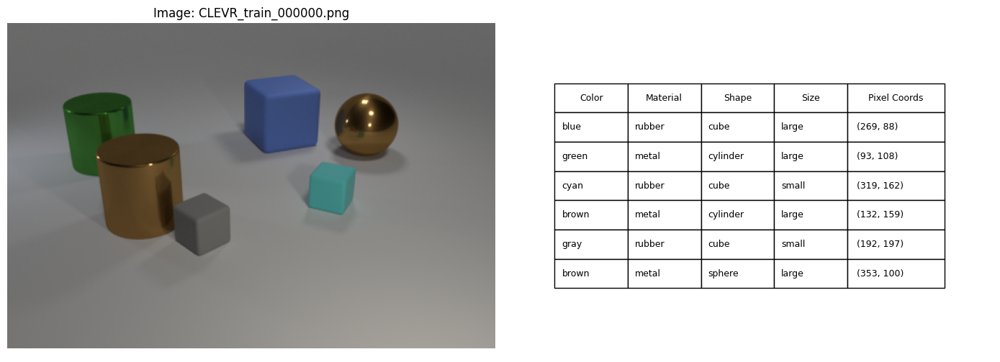

,color,material,shape,size,pixel_coords,3d_coords
0,blue,rubber,cube,large,"[269, 88, 12.661545753479004]","[-1.3705521821975708, 2.0794010162353516, 0.69..."
1,green,metal,cylinder,large,"[93, 108, 11.522202491760254]","[-2.9289753437042236, -1.7488206624984741, 0.6..."
2,cyan,rubber,cube,small,"[319, 162, 10.045343399047852]","[1.5515961647033691, 0.6776641607284546, 0.349..."
3,brown,metal,cylinder,large,"[132, 159, 9.392304420471191]","[-0.25301405787467957, -2.3089325428009033, 0...."
4,gray,rubber,cube,small,"[192, 197, 8.907766342163086]","[1.018894076347351, -1.93693208694458, 0.34999..."
5,brown,metal,sphere,large,"[353, 100, 11.964213371276855]","[0.43993687629699707, 2.9987525939941406, 0.69..."




Visualisation des 4 tâches



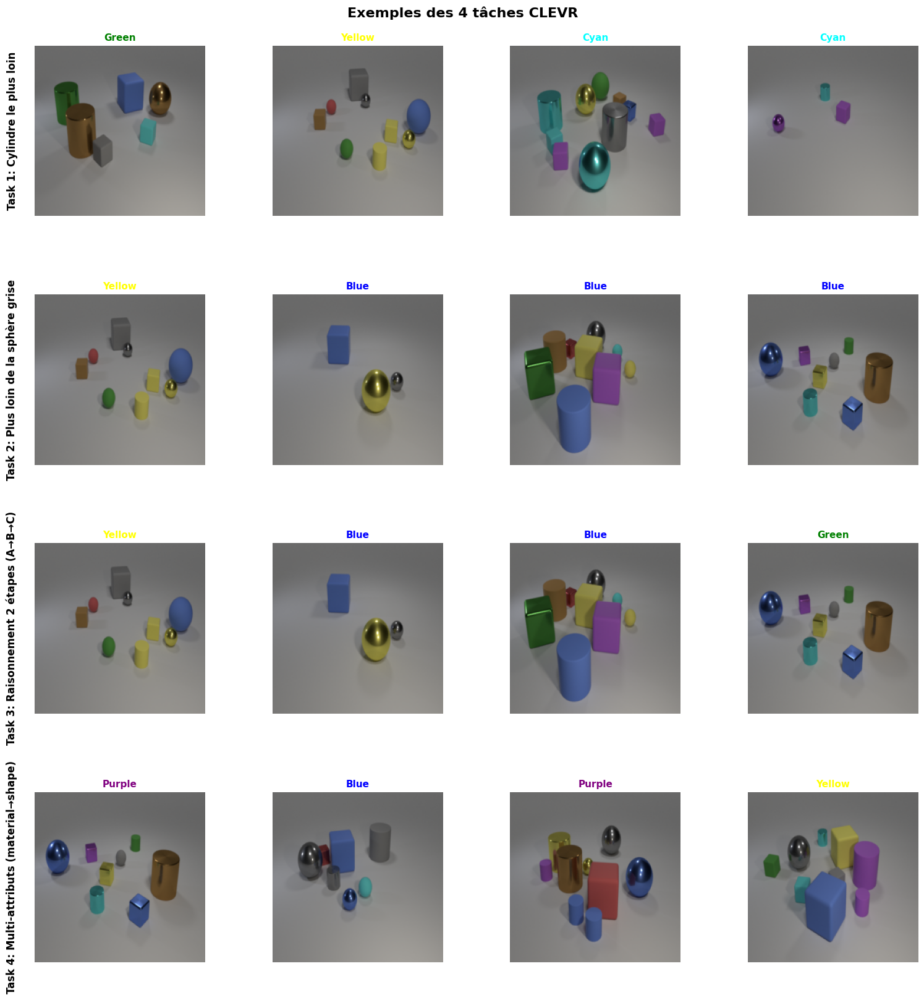

In [1]:
import json
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import os
import torch

# Afficher un exemple de scène CLEVR brute
scene_path = 'step2/data_clevr/CLEVR_v1.0/scenes/CLEVR_train_scenes.json'
with open(scene_path, 'r') as f:
    scenes_data = json.load(f)

# Prendre la première scène comme exemple
example_scene = scenes_data['scenes'][0]
image_filename = example_scene['image_filename']
objects = example_scene['objects']

# Créer un DataFrame avec les informations des objets
objects_df = pd.DataFrame(objects)
# Sélectionner les colonnes pertinentes
cols_to_show = ['color', 'material', 'shape', 'size', 'pixel_coords', '3d_coords']
objects_df = objects_df[cols_to_show]

print(f"Exemple de scène: {image_filename}")
print(f"Nombre d'objets: {len(objects)}\n")

# Afficher l'image correspondante
img_path = f'step2/data_clevr/CLEVR_v1.0/images/train/{image_filename}'
img = Image.open(img_path)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
ax1.imshow(img)
ax1.axis('off')
ax1.set_title(f'Image: {image_filename}', fontsize=12)

# Afficher le dataframe comme texte
ax2.axis('off')
table_data = []
for idx, row in objects_df.iterrows():
    table_data.append([
        row['color'],
        row['material'], 
        row['shape'],
        row['size'],
        f"({row['pixel_coords'][0]:.0f}, {row['pixel_coords'][1]:.0f})"
    ])

table = ax2.table(cellText=table_data,
                  colLabels=['Color', 'Material', 'Shape', 'Size', 'Pixel Coords'],
                  cellLoc='left',
                  loc='center',
                  colWidths=[0.15, 0.15, 0.15, 0.15, 0.2])
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1, 2)

plt.tight_layout()
plt.show()

# Afficher le DataFrame complet en dessous
display(objects_df)

print("\n" + "="*80 + "\n")
print("Visualisation des 4 tâches\n")

# Afficher 4x4 grilles d'images pour chaque tâche
from step2.utils import get_dataset, LABEL_NAMES

fig, axes = plt.subplots(4, 4, figsize=(16, 16))
fig.suptitle('Exemples des 4 tâches CLEVR', fontsize=16, fontweight='bold', y=1.01)

for task_idx, task in enumerate([1, 2, 3, 4], start=0):
    # Charger le dataset pour cette tâche
    dataset = get_dataset(task=task, split='train')
    
    # Titre de la ligne
    task_title = f"Task {task}"
    if task == 1:
        task_title += ": Cylindre le plus loin"
    elif task == 2:
        task_title += ": Plus loin de la sphère grise"
    elif task == 3:
        task_title += ": Raisonnement 2 étapes (A→B→C)"
    elif task == 4:
        task_title += ": Multi-attributs (material→shape)"
    
    # Afficher 4 images pour cette tâche
    for img_idx in range(4):
        ax = axes[task_idx, img_idx]
        
        # Récupérer l'image et le label
        image, label = dataset[img_idx]
        
        # Convertir le tensor en image PIL pour l'affichage
        if isinstance(image, torch.Tensor):
            # Dénormaliser si nécessaire (ImageNet normalization)
            mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
            std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
            image = image * std + mean
            image = torch.clamp(image, 0, 1)
            image = image.permute(1, 2, 0).numpy()
        
        ax.imshow(image)
        ax.axis('off')
        
        # Titre avec le label
        color_name = LABEL_NAMES[label]
        ax.set_title(f'{color_name.capitalize()}', fontsize=11, fontweight='bold', 
                     color=color_name if color_name not in ['gray', 'brown'] else 'black')
        
        # Ajouter le titre de la tâche sur la première colonne
        if img_idx == 0:
            ax.text(-0.1, 0.5, task_title, transform=ax.transAxes,
                   fontsize=12, fontweight='bold', rotation=90,
                   verticalalignment='center', horizontalalignment='right')

plt.tight_layout()
plt.subplots_adjust(top=0.97)
plt.show()

## Modèles

Nous avons choisi deux architectures préentraînées sur ImageNet-1K avec des performances comparables :

- **ResNet-50** : acc@5 = 92.862% sur ImageNet-1K
- **ViT-B/16** : acc@5 = 95.318% sur ImageNet-1K

Pour adapter ces modèles à notre tâche de classification à 8 classes, nous remplaçons uniquement la dernière couche (sous step2/models.py) :

```python
def get_resnet50_model(num_classes):
    weights = ResNet50_Weights.DEFAULT 
    model = resnet50(weights=weights)
    
    # Remplacer la couche finale (2048 → num_classes)
    in_features = model.fc.in_features 
    model.fc = nn.Linear(in_features, num_classes)
    
    return model

def get_vit_b_16_model(num_classes):
    weights = ViT_B_16_Weights.DEFAULT
    model = vit_b_16(weights=weights)
    
    # Remplacer la tête de classification (768 → num_classes)
    in_features = model.heads.head.in_features
    model.heads.head = nn.Linear(in_features, num_classes)
    
    return model
```


**Configuration d'entraînement** :
- Optimizer : AdamW
- Learning rate : 1e-5
- Weight decay : 0.01
- Loss : CrossEntropyLoss
- Epochs : Maximum 10 (early stopping si overfitting détecté)
- Sauvegarde : Meilleur checkpoint basé sur la loss de validation

Cette approche de fine-tuning permet de tirer parti des représentations visuelles apprises sur ImageNet tout en adaptant les modèles aux tâches de raisonnement spatial de CLEVR.



## Analyse d'interprétabilité des modèles

Dans cette section, nous analysons les décisions des modèles **ResNet-50** et **ViT-B/16** sur le jeu de test. L'objectif est de comprendre **où** et **comment** les modèles concentrent leur attention pour effectuer leurs prédictions. Nous utilisons trois méthodes d'interprétabilité complémentaires :

### Méthodes utilisées

1. **GradCAM (Gradient-weighted Class Activation Mapping)**  
   - Cette méthode génère une heatmap indiquant les régions de l'image qui contribuent le plus à la prédiction d'une classe donnée.  
   - Pour le **ResNet**, GradCAM est appliqué sur la dernière couche convolutive du modèle (`layer4[-1]`).  
   - Pour le **ViT**, GradCAM est adapté pour fonctionner sur les représentations spatiales des tokens dans la dernière couche d'attention (`encoder.layers[-1].ln_1`).

2. **Integrated Gradients (IG)**  
   - Cette méthode attribue une importance à chaque pixel de l'image en intégrant les gradients le long d'un chemin entre une image de référence (baseline) et l'image d'entrée.  
   - Elle permet d'obtenir une vue fine des pixels les plus influents pour la prédiction.  
   - Pour le **ViT**, IG est adapté pour capturer les contributions des tokens.

3. **Occlusion**  
   - Cette méthode consiste à masquer des parties de l'image (par exemple, des fenêtres de 32x32 pixels) et à mesurer l'impact sur la prédiction.  
   - Elle identifie les régions critiques pour la décision du modèle.  
   - Appliquée de manière identique pour le **ResNet** et le **ViT**.

### Étapes de l'analyse

1. **Sélection des cas intéressants**  
   Nous identifions des exemples où les modèles se comportent différemment :  
   - Cas où le **ResNet** échoue mais le **ViT** réussit.  
   - Cas où le **ViT** échoue mais le **ResNet** réussit.  
   - Cas où les deux modèles échouent.  
   - Cas où les deux modèles réussissent.

2. **Application des méthodes d'interprétabilité**  
   Pour chaque exemple sélectionné, nous appliquons les trois méthodes ci-dessus afin de visualiser les régions importantes pour chaque modèle.

Ces analyses permettent de mieux comprendre les forces et les limites des deux architectures sur des tâches de raisonnement visuel complexes.

In [2]:
# # Run this once at setup
# !./step2/setup_opencv.sh > /dev/null 2>&1
# !pip install --upgrade jupyter > /dev/null 2>&1

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Import utility functions
import sys
sys.path.append('..')
from step2.utils import (
    load_models,
    get_dataset,
    plot_training_metrics,
    find_prediction_cases,
    analyze_sample,
    LABEL_NAMES
)

# Set device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

Using device: cuda


## Tâche 2 : Objet le plus éloigné de la sphère grise

**Question** : « Quelle est la couleur de l'objet le plus éloigné de la sphère grise ? »

Cette tâche demande :
1. Localiser la sphère grise (objet ancre)  
2. Calculer les distances relatives entre cette sphère et tous les autres objets  
3. Identifier la couleur de l'objet le plus éloigné

**Hypothèse** : le ViT devrait mieux s'en sortir grâce à l'attention globale ; ResNet peut avoir du mal avec les dépendances spatiales long‑distance.


### Métriques d'entraînement et résultats

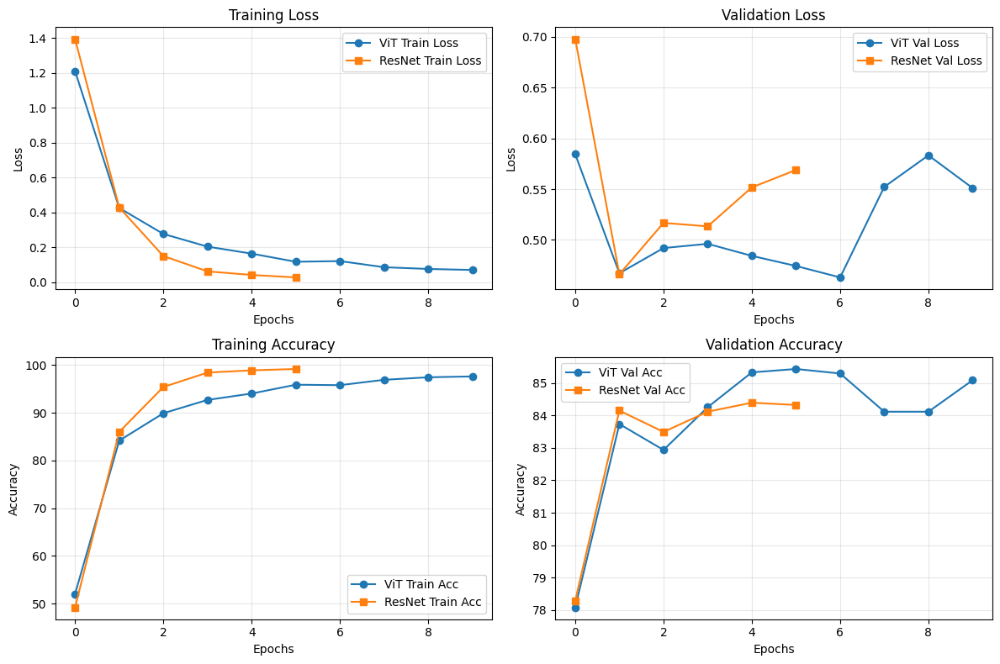

In [4]:
# Plot training curves for Task 2
plot_training_metrics(task=2)

In [5]:
# Load models for Task 2
resnet_task2, vit_task2 = load_models(task=2, device=device)

# Find prediction cases
cases_task2 = find_prediction_cases(resnet_task2, vit_task2, task=2, split='val', device=device)

Task 2 - VAL set analysis:
  Both correct: 2346 (74.8%)
  CNN wrong, ViT right: 329 (10.5%)
  ViT wrong, CNN right: 263 (8.4%)
  Both wrong: 199 (6.3%)


### Analyse des résultats pour la tâche 2 : Objet le plus éloigné de la sphère grise

#### Résumé des performances sur le jeu de validation :
- **Prédictions correctes pour les deux modèles** : 2346 (74.8%)  
- **CNN incorrect, ViT correct** : 329 (10.5%)  
- **ViT incorrect, CNN correct** : 263 (8.4%)  
- **Les deux modèles incorrects** : 199 (6.3%)  

#### Interprétation des résultats :
Cette tâche montre des performances relativement équilibrées entre les deux modèles. Le Vision Transformer (ViT) semble légèrement mieux adapté pour capturer les relations globales nécessaires à cette tâche, comme le montre le nombre de cas où le **CNN échoue mais le ViT réussit** (10.5% contre 8.4% pour l'inverse).

#### Analyse des courbes d'entraînement :
- **ResNet-50** :  
  - Le modèle montre des signes d'**overfitting sévère** dès les premières époques. L'accuracy sur le jeu d'entraînement atteint presque 99% avec une loss proche de zéro, mais l'accuracy sur le jeu de validation plafonne à 84%. Cela indique que le modèle a du mal à généraliser sur des données non vues.  
- **ViT-B/16** :  
  - Le ViT commence également à **overfitter** à partir de l'époque 6, mais de manière moins prononcée que le ResNet. Son accuracy sur le jeu de validation reste légèrement supérieure, ce qui reflète sa capacité à mieux généraliser.


Cette tâche reste relativement équilibrée entre les deux modèles, mais le ViT semble avoir un léger avantage grâce à son mécanisme d'attention globale, qui lui permet de mieux modéliser les relations spatiales complexes. Le ResNet, en revanche, montre une forte dépendance aux textures locales, ce qui peut limiter ses performances sur des tâches nécessitant un raisonnement global.

### Interprétabilité - Tâche 2
#### Both Models Right

Ground Truth: green
ResNet Prediction: green ✓
ViT Prediction: green ✓



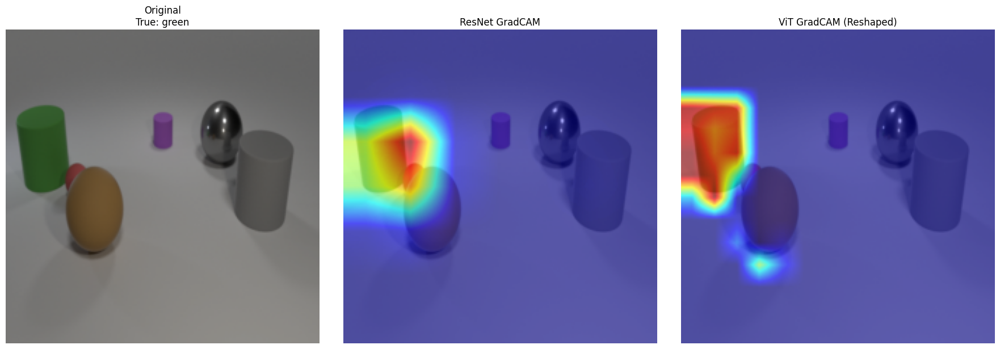

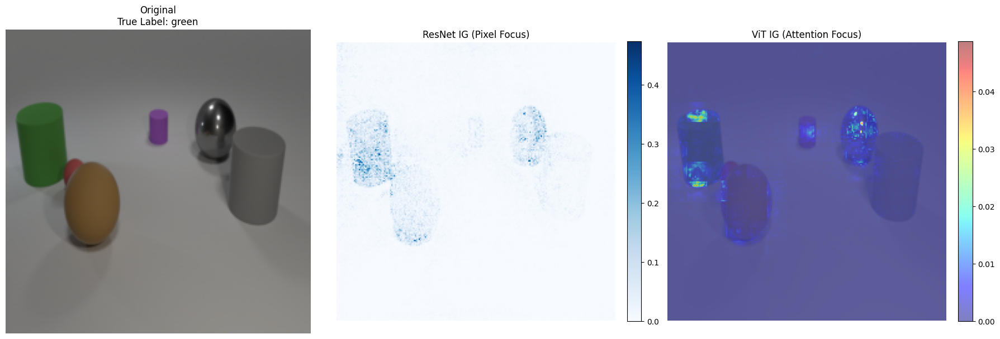

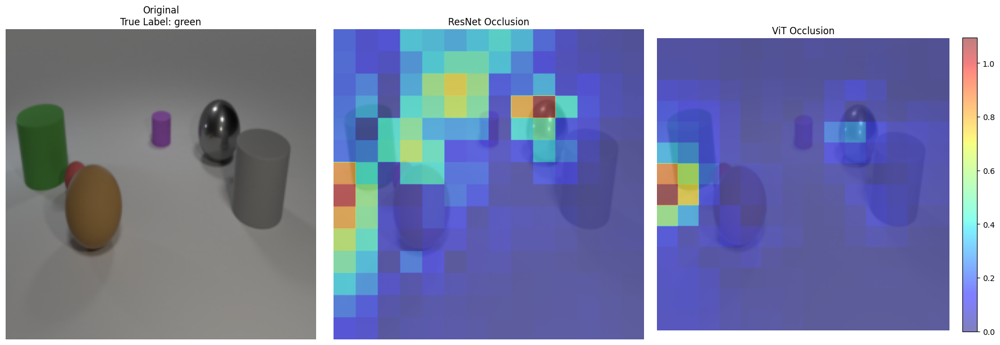

In [6]:
# Analyze first case where CNN fails but ViT succeeds
if len(cases_task2['both_right']) > 0:
    idx = cases_task2['both_right'][0]
    analyze_sample(resnet_task2, vit_task2, task=2, idx=idx, device=device, 
                   methods=[
                       'gradcam', 
                       'ig', 
                       'occlusion'
                       ])
else:
    print("No cases where CNN fails and ViT succeeds!")

Sur cet exemple, les deux modèles prédisent correctement la couleur **verte** de l'objet le plus éloigné de la sphère grise, qui est un cylindre vert situé à gauche de la scène.

On remarque sur les méthodes *Integrated Gradients* et *Occlusion* que les deux modèles se concentrent sur les bons objets clés : la sphère grise (ancre) et le cylindre vert (cible), tandis que le *GradCAM* met en avant uniquement le cylindre vert pour les deux modèles. Cela est logique car la methode *GradCAM* se base sur les activations finales du modèle, qui sont plus directement liées à l'objet cible dans ce cas.

#### CNN Wrong, ViT Correct

In [7]:
from importlib import reload
from step2 import utils
reload(utils)
from step2.utils import analyze_sample

Ground Truth: cyan
ResNet Prediction: yellow ✗
ViT Prediction: cyan ✓



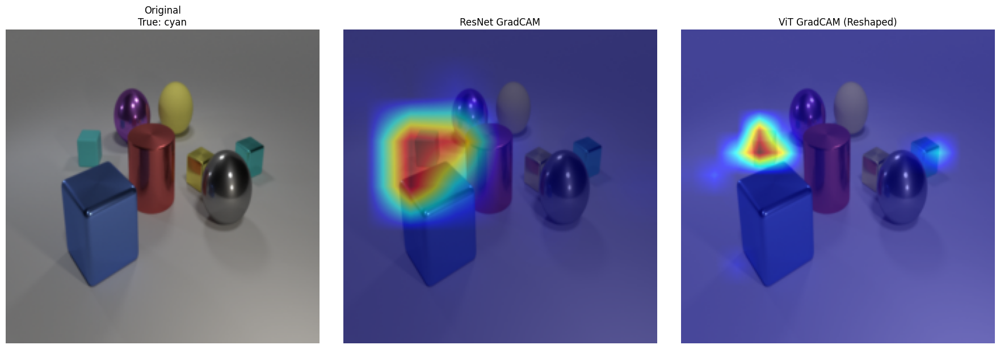

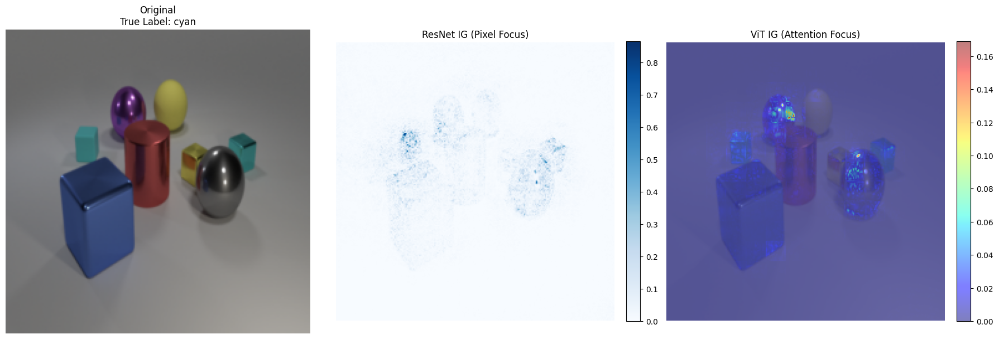

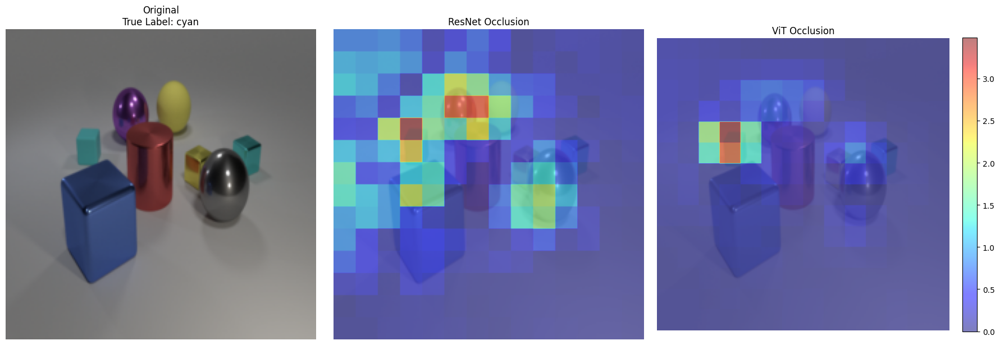

In [8]:
# Analyze first case where CNN fails but ViT succeeds
if len(cases_task2['cnn_wrong_vit_right']) > 0:
    idx = cases_task2['cnn_wrong_vit_right'][5]
    analyze_sample(resnet_task2, vit_task2, task=2, idx=idx, device=device, 
                   methods=[
                       'gradcam', 
                       'ig', 
                       'occlusion'
                       ])
else:
    print("No cases where CNN fails and ViT succeeds!")

#### ViT Wrong, CNN Correct

Ground Truth: brown
ResNet Prediction: brown ✓
ViT Prediction: cyan ✗



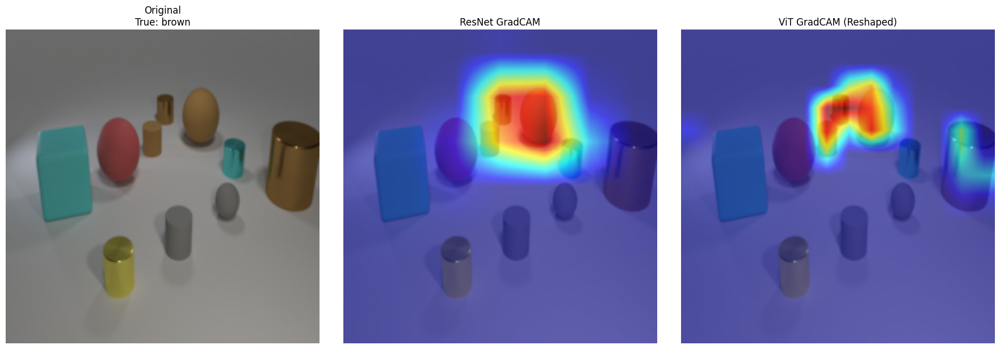

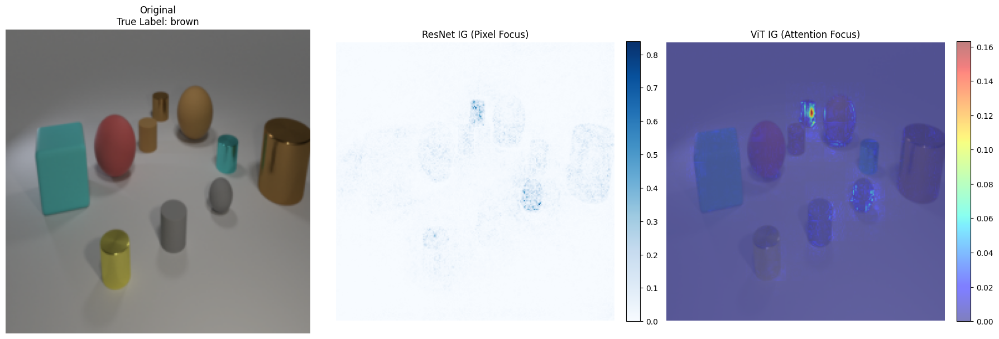

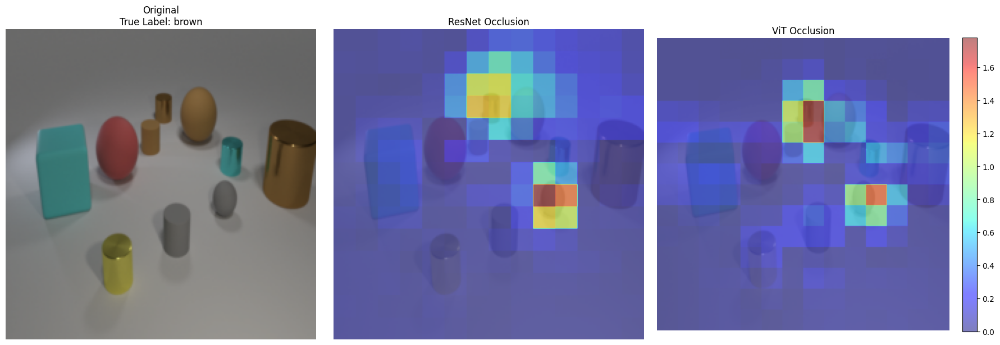

In [9]:
# Analyze first case where ViT fails but CNN succeeds
if len(cases_task2['vit_wrong_cnn_right']) > 0:
    idx = cases_task2['vit_wrong_cnn_right'][0]
    analyze_sample(resnet_task2, vit_task2, task=2, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where ViT fails and CNN succeeds!")

#### Both Models Wrong

Ground Truth: brown
ResNet Prediction: purple ✗
ViT Prediction: purple ✗



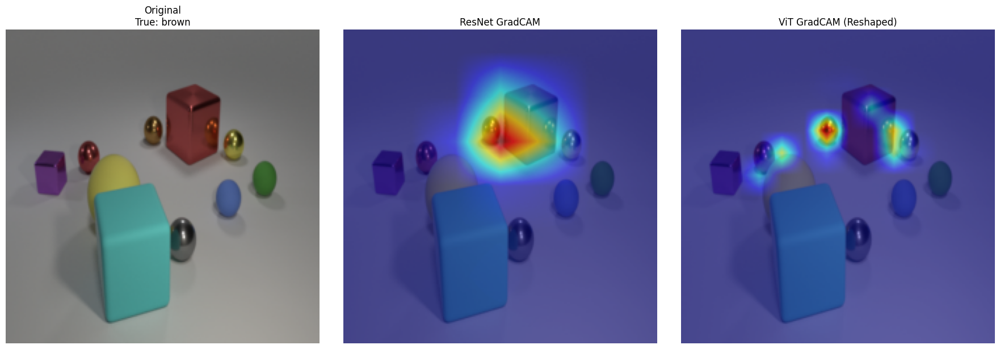

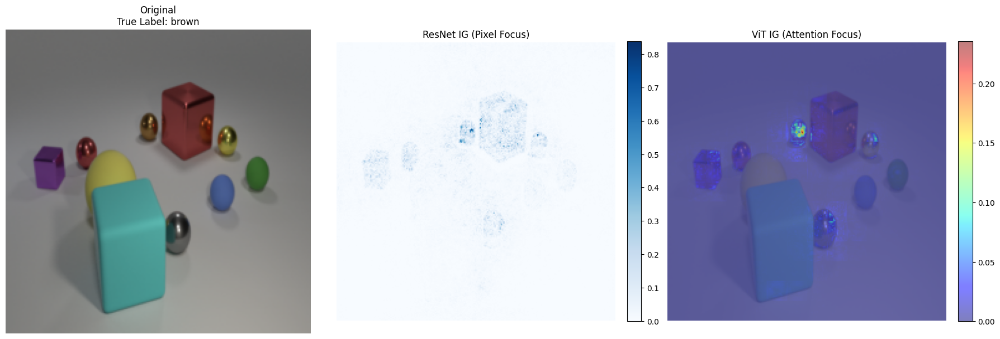

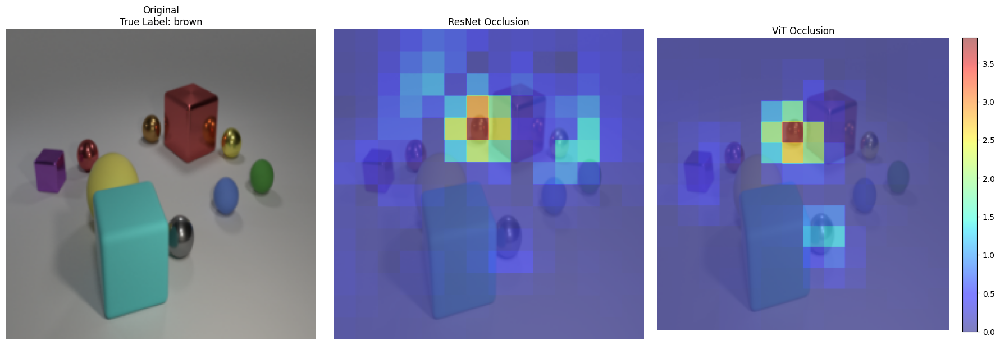

In [10]:
# Analyze first case where both models fail
if len(cases_task2['both_wrong']) > 0:
    idx = cases_task2['both_wrong'][1]
    analyze_sample(resnet_task2, vit_task2, task=2, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where both models fail!")

#### Analyse des erreurs des modèles

Dans les exemples précedents où nous regardons lorsqu'au moins un modèle se trompe, l'utilisation de méthodes d'interprétabilité comme l'occlusion s'avère tout aussi cruciale lorsque le modèle échoue. Si, dans le cas d'une prédiction correcte, elle permet de **valider** que le modèle s'appuie sur les attributs pertinents, elle permet en cas d'erreur de **diagnostiquer l'origine de la défaillance**.

En particulier, lorsque le modèle a faux : On cherche la Causalité. On veut savoir pourquoi il a dit *violet* au lieu de *marron*. 

- Si les cartes de chaleurs "s'allument" sur un mauvais objet, le modèle a **un problème de raisonnement spatial**.

- Si les cartes de chaleurs "s'allument" sur le bon objet mais que la prédiction reste fausse, le modèle a **un problème d'identification d'attribut** (il voit l'objet mais ne reconnaît pas sa couleur).

On remarque que dans les 3 exemples précedents, à chaque fois que l'un des modèles se trompe, les trois méthodes d'interprétabilité convergent pour montrer que le modèle s'est concentré sur les bons objets clés. Cela suggère que les erreurs proviennent probablement d'une mauvaise interprétation des attributs (comme la couleur) plutôt que d'un échec à localiser les objets pertinents.

On remarque d'ailleurs que pour le ViT, la taille de l'objet à prédire semble influencer les erreurs : dans les deux exemples où il se trompe, l'objet cible est **petit** (cylindre marron et cube jaune). Cela pourrait indiquer que le ViT a des difficultés à capturer les détails fins des petits objets, ce qui affecte sa capacité à identifier correctement leurs attributs.

### Analyse des erreurs par attributs - Tâche 2

Analysons maintenant les erreurs des modèles en fonction des attributs des objets (couleur, matériau, forme, taille) pour comprendre si certaines caractéristiques sont plus difficiles à traiter.

Analyzing ResNet errors...



ResNet - Task 2 - VAL
Overall Accuracy: 83.17% (2609/3137)
Total Errors: 528

Analyzing ViT errors...

ViT - Task 2 - VAL
Overall Accuracy: 85.27% (2675/3137)
Total Errors: 462


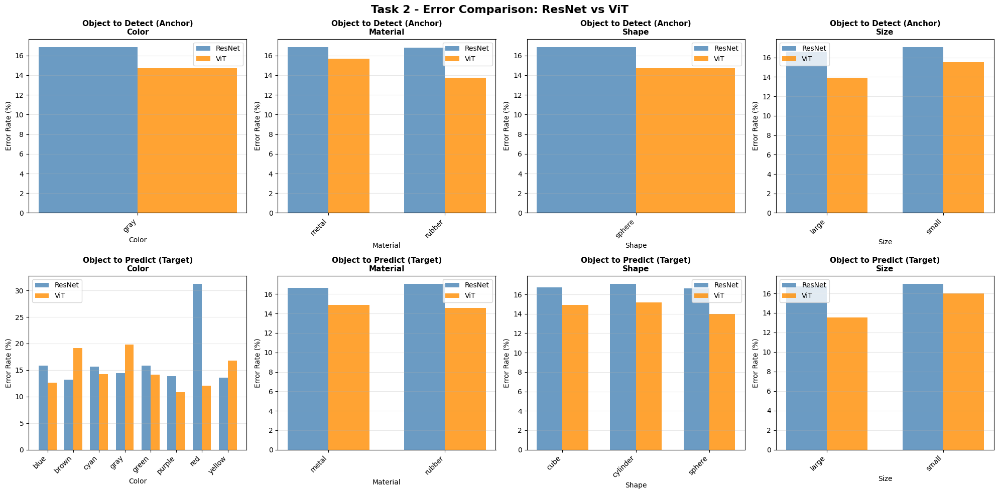

In [11]:
from step2.utils import compare_models_by_attribute

# Comparer les deux modèles côte à côte
resnet_stats_task2, vit_stats_task2 = compare_models_by_attribute(resnet_task2, vit_task2, task=2, split='val', device=device)

# print_attribute_summary(resnet_stats_task2, 'ResNet-50')
# print_attribute_summary(vit_stats_task2, 'ViT-B/16')

**Taille de l'objet et Patch Size (ViT)**  
Le ViT montre un taux d'erreur plus élevé sur les petits objets, en raison de sa discrétisation en patchs de **16x16 pixels**. Les petits objets peuvent être dilués ou mal représentés, ce qui complique l'extraction de leurs attributs. En revanche, le ResNet, grâce à ses convolutions locales, conserve une meilleure granularité spatiale. Ainsi, on ne voit pas de différence significative dans les erreurs liées à la taille pour le ResNet.

**Biais de couleur (ResNet vs ViT)**  
- **ResNet** : Les erreurs sur les objets rouges révèlent un **biais de texture**, le modèle sur-réagissant à cette couleur très contrastée. Cela peut entraîner des confusions avec d'autres objets saillants.  
- **ViT** : Les erreurs sur les couleurs neutres (marron, gris) indiquent une difficulté à distinguer ces teintes du fond ou des ombres, en raison de leur faible saturation. Le ViT semble nécessiter des signaux chromatiques plus distincts pour stabiliser son attention.

## Tâche 3 : Raisonnement en deux étapes

**Question** :  
1. Trouver la sphère grise.  
2. Identifier l'objet le plus proche de cette sphère.  
3. Déterminer la couleur de l'objet le plus éloigné de ce voisin.

Cette tâche implique un raisonnement séquentiel en plusieurs étapes :  
- Localiser un objet spécifique (la sphère grise).  
- Calculer les distances relatives pour trouver un voisin proche.  
- Répéter le calcul pour identifier un objet éloigné.

**Hypothèse** : Cette tâche met en évidence les limites des CNNs, qui doivent empiler plusieurs couches pour capturer des relations complexes. Le ViT, grâce à son attention multi-tête, peut traiter ces étapes simultanément en modélisant les relations entre tous les objets dès les premières couches.

### Métriques d'entraînement et résultats

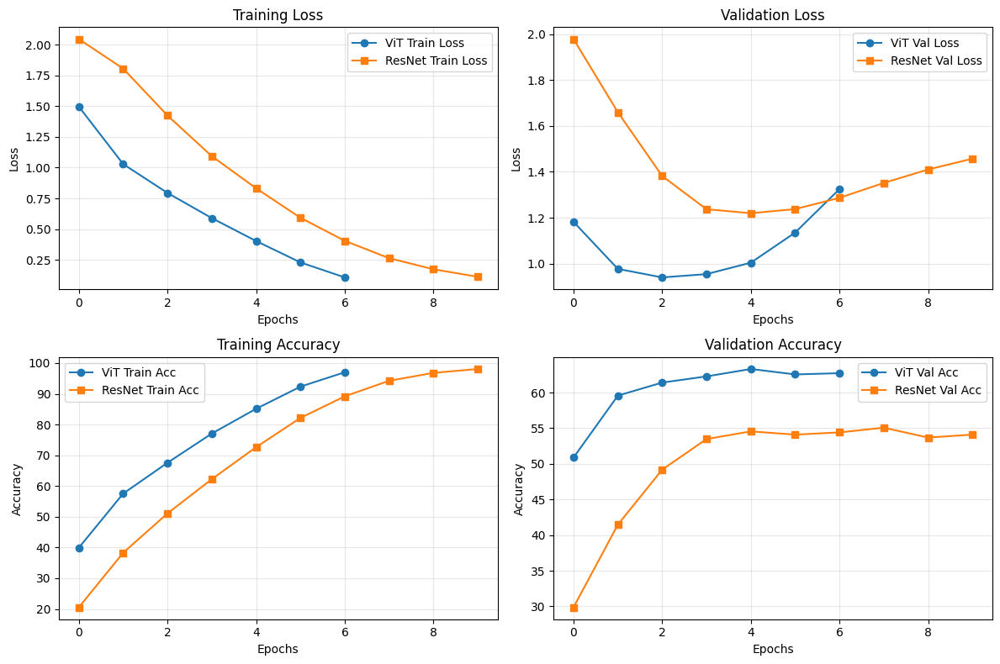

In [12]:
# Plot training curves for Task 3
plot_training_metrics(task=3)

In [13]:
# Load models for Task 3
resnet_task3, vit_task3 = load_models(task=3, device=device)

# Find prediction cases
cases_task3 = find_prediction_cases(resnet_task3, vit_task3, task=3, split='val', device=device)

Task 3 - VAL set analysis:
  Both correct: 1219 (38.9%)
  CNN wrong, ViT right: 629 (20.1%)
  ViT wrong, CNN right: 409 (13.0%)
  Both wrong: 880 (28.1%)


### **Analyse des résultats pour la tâche 3** : Raisonnement en deux étapes

**Résumé des performances sur le jeu de validation :**
- **Prédictions correctes pour les deux modèles** : 1219 (38.9%)  
- **CNN incorrect, ViT correct** : 629 (20.1%)  
- **ViT incorrect, CNN correct** : 409 (13.9%)  
- **Les deux modèles incorrects** : 880 (28.1%)  

**Interprétation des résultats :**
Le Vision Transformer (ViT) semble légèrement mieux adapté pour capturer les relations globales nécessaires à cette tâche, comme le montre le nombre de cas où le **CNN échoue mais le ViT réussit** (20.1% contre 13.9% pour l'inverse).
Malgré tout, les deux modèles rencontrent des difficultés significatives, avec un taux d'erreur élevé (28.1%) lorsque les deux échouent. Cela souligne la complexité de la tâche de raisonnement en deux étapes.
**Analyse des courbes d'entraînement :**
- **ResNet-50** : Le modèle montre des signes d'**overfitting sévère** dès les premières époques. L'accuracy sur le jeu d'entraînement atteint plus de 95%, avec une loss proche de zéro, tandis que l'accuracy sur le jeu de validation plafonne à seulement 55%. Cela indique que le modèle a du mal à généraliser sur des données non vues.  
- **ViT-B/16** : Le ViT présente également un **overfitting important**, atteignant une accuracy supérieure à 95% sur le jeu d'entraînement, mais l'accuracy sur le jeu de validation stagne à 64%. Bien que légèrement meilleur que le ResNet, le ViT souffre également d'une faible capacité de généralisation.

**Améliorations possibles :**
Pour stabiliser l'entraînement et améliorer la généralisation, plusieurs stratégies auraient pu être envisagées :
1. **Fine-tuning des poids préentraînés** :  
   Utiliser les poids des modèles entraînés sur la tâche précédente, plus simple (par exemple, la tâche 2), et fine-tuner ces modèles avec un faible learning rate pour cette tâche complexe. Cela aurait permis de mieux exploiter les représentations apprises tout en évitant un surapprentissage rapide.
   
2. **Augmentation du dropout** :  
   Ajouter davantage de dropout dans les dernières couches des modèles pour réduire le surapprentissage et améliorer la robustesse.

3. **Data augmentation** :  
   Appliquer des techniques de data augmentation (par exemple, des transformations géométriques ou des modifications de couleur) pour compenser la taille réduite du jeu d'entraînement pour cette tâche.

Ces ajustements auraient pu améliorer la stabilité de l'entraînement et permettre aux modèles de mieux généraliser sur le jeu de validation.

### **Interprétabilité - Tâche 3**

Rappel de la tâche 3 :

1. Trouver la sphère grise.  
2. Identifier l'objet le plus proche de cette sphère.  
3. Déterminer la couleur de l'objet le plus éloigné de ce voisin.

#### CNN Wrong, ViT Correct

Dans le cas présenté ci-dessous, le modèle ResNet-50 prédit incorrectement tandis que le ViT-B/16 donne la bonne réponse. On peut voir un cas de **raisonnement spatial complexe** où **le ViT parvient à identifier correctement les relations entre les objets** sur les 3 méthodes d'interprétabilité.

En revanche le ResNet ne semble même pas localiser la sphère grise correctement, ce qui conduit à une erreur dans les étapes suivantes du raisonnement, comme cela est mis en évidence par la methode **d'occlusion**.

Ground Truth: green
ResNet Prediction: cyan ✗
ViT Prediction: green ✓



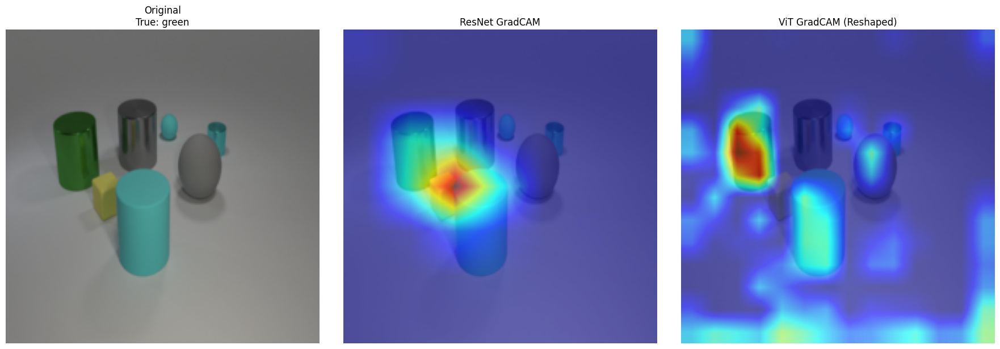

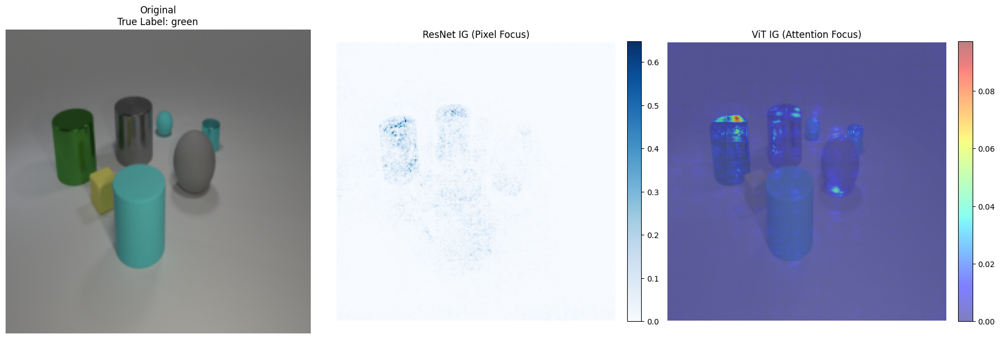

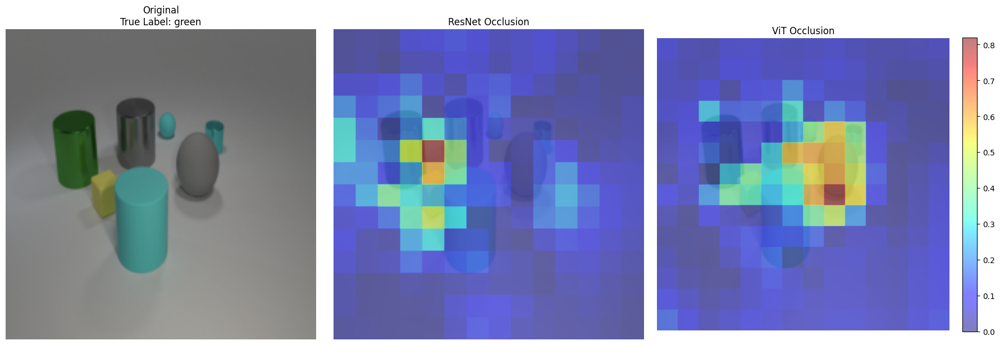

In [14]:
if len(cases_task3['cnn_wrong_vit_right']) > 0:
    idx = cases_task3['cnn_wrong_vit_right'][0]
    analyze_sample(resnet_task3, vit_task3, task=3, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where CNN fails and ViT succeeds!")

#### Case 2: ViT Wrong, CNN Correct

Ground Truth: blue
ResNet Prediction: blue ✓
ViT Prediction: green ✗



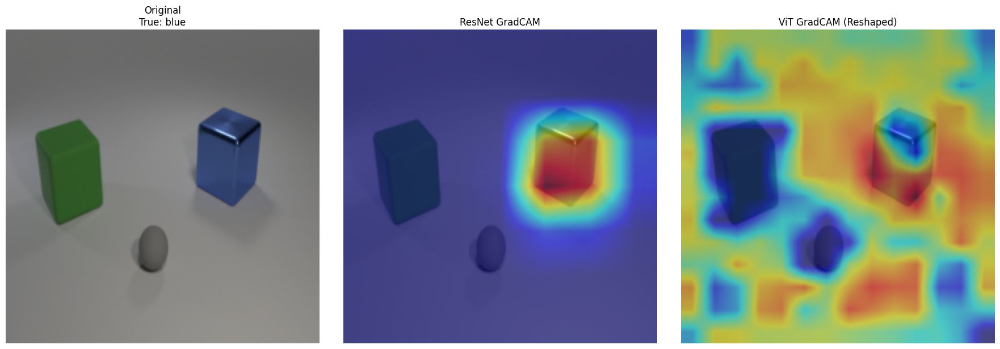

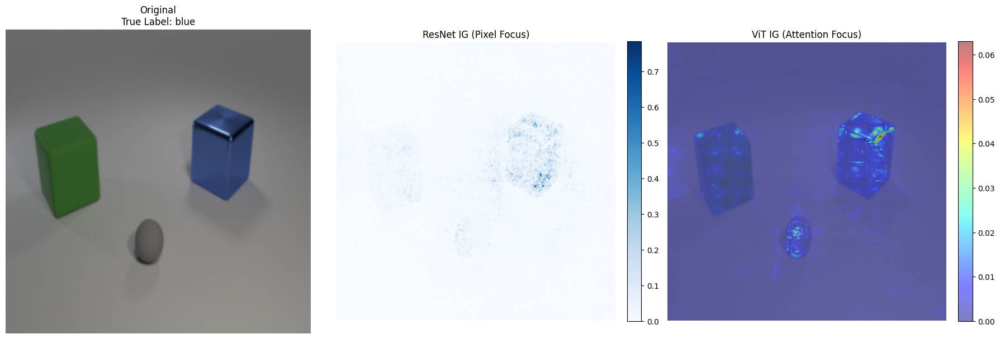

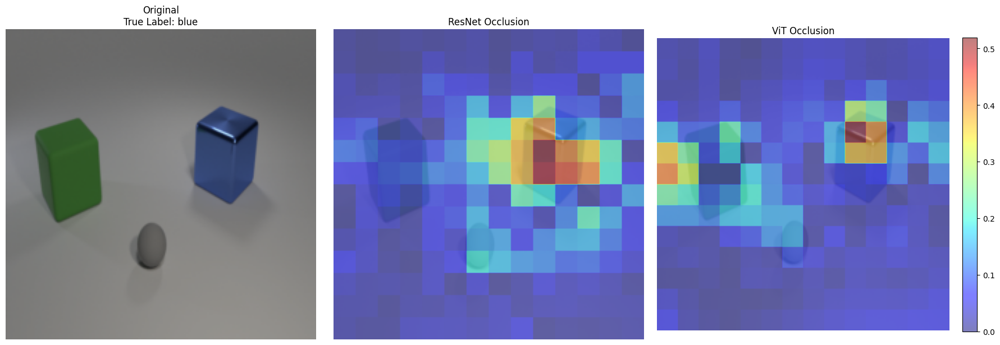

In [15]:
if len(cases_task3['vit_wrong_cnn_right']) > 0:
    idx = cases_task3['vit_wrong_cnn_right'][0]
    analyze_sample(resnet_task3, vit_task3, task=3, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where ViT fails and CNN succeeds!")

#### Case 3: Both Models Wrong

Ground Truth: brown
ResNet Prediction: green ✗
ViT Prediction: green ✗



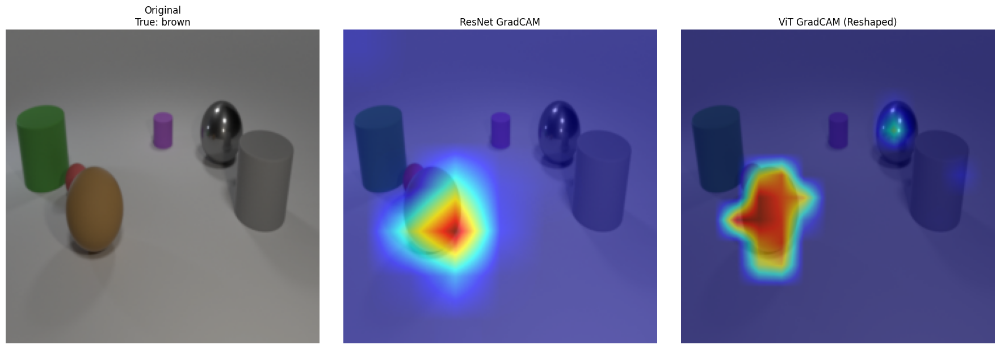

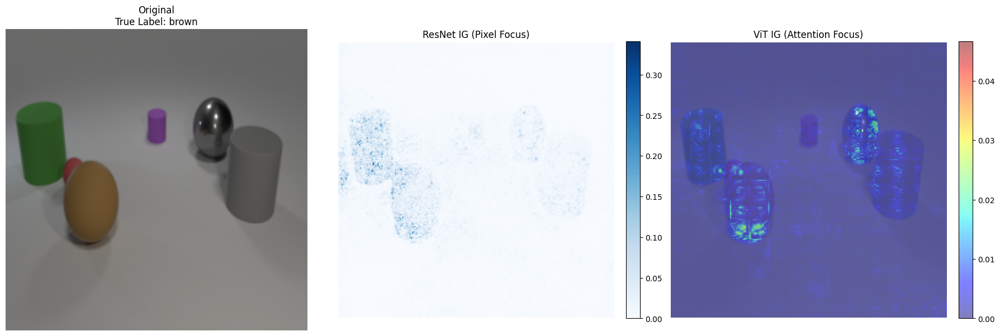

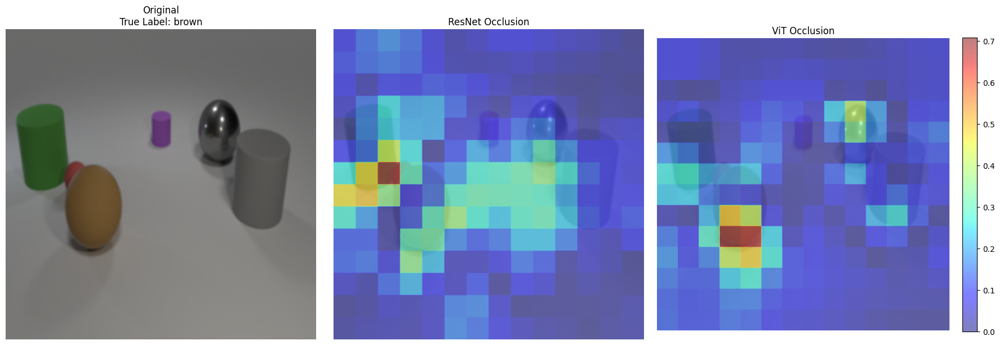

In [16]:
if len(cases_task3['both_wrong']) > 0:
    idx = cases_task3['both_wrong'][0]
    analyze_sample(resnet_task3, vit_task3, task=3, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where both models fail!")

Analyzing ResNet errors...



ResNet - Task 3 - VAL
Overall Accuracy: 51.90% (1628/3137)
Total Errors: 1509

Analyzing ViT errors...

ViT - Task 3 - VAL
Overall Accuracy: 58.91% (1848/3137)
Total Errors: 1289


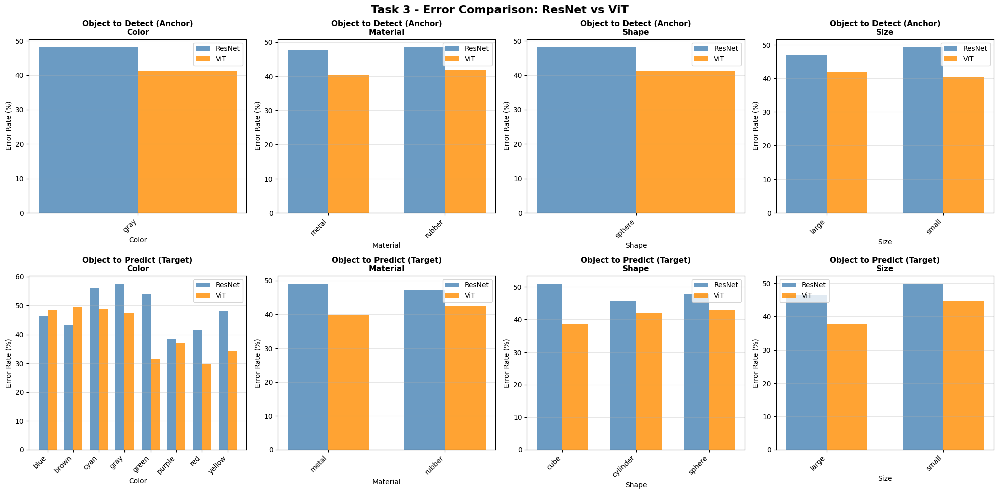

In [17]:
resnet_stats_task3, vit_stats_task3 = compare_models_by_attribute(resnet_task3, vit_task3, task=3, split='val', device=device)

#### **Interprétation des erreurs - Cas où les deux modèles échouent**

Dans les cas où **les deux modèles échouent**, plusieurs observations peuvent être faites :

1. **ResNet** :  
   - Le ResNet semble avoir du mal à identifier correctement l'objet à prédire. Bien que **GradCAM** s'active sur certaines régions pertinentes, les méthodes **Pixel Importance** et **Occlusion** montrent que le modèle semble faire des prédictions aléatoires lorsqu'il y a beaucoup d'objets dans la scène. Cela indique une difficulté à établir des relations spatiales complexes et à localiser l'objet cible.

2. **ViT** :  
   - Lorsque le ViT échoue, cela semble principalement dû à une incapacité à capturer correctement les couleurs. Les méthodes **Occlusion** et **Pixel Importance** montrent que le ViT détecte correctement l'ancre (la sphère grise), contrairement au ResNet, qui ne parvient pas à la localiser.  
   - De plus, le ViT identifie souvent l'objet cible (comme le montre **Occlusion** et **Pixel Importance**), mais échoue à le labelliser correctement, ce qui suggère une difficulté à interpréter les attributs de couleur.

#### **Analyse des erreurs par couleur**

En interprétant directement les figures des erreurs, on observe que le ViT a des difficultés significatives avec certaines couleurs :  
- **Blue, Brown, Cyan, Grey** : Le taux d'erreur est proche de **50%**, ce qui indique une difficulté à distinguer ces couleurs, probablement en raison de leur faible saturation ou de leur similarité avec le fond.  
- **Green, Purple, Red, Yellow** : Le taux d'erreur est plus faible, entre **30% et 40%**, ce qui montre que le modèle est plus performant pour ces couleurs, probablement en raison de leur contraste plus élevé.

Ces observations mettent en évidence les forces et les limites des deux modèles :  
- Le **ResNet** a du mal à établir des relations spatiales complexes et à localiser les objets dans des scènes denses.  
- Le **ViT**, bien qu'il excelle dans la localisation des objets, montre des difficultés à interpréter correctement les attributs de couleur pour certains cas.

## Résumé et Conclusions

### **Points Clés** — Comparaison de l'Interprétabilité

**Analyse GradCAM** :
- **ResNet-50** : Les activations se concentrent sur les **textures locales** et les contours des objets, reflétant la dépendance des CNN à l'extraction hiérarchique des caractéristiques via les couches convolutives.
- **ViT-B/16** : GradCAM révèle une **attention au niveau des patchs** répartie sur plusieurs objets, démontrant la capacité du modèle à traiter simultanément les relations spatiales globales.

**Integrated Gradients** :
- Les deux modèles fournissent des cartes d'attribution au niveau des pixels, mais avec des schémas distincts :
  - **ViT** : Importance répartie uniformément sur tous les objets pertinents dans la chaîne de raisonnement (ancre → intermédiaire → cible).
  - **ResNet** : Importance concentrée sur les bords contrastés et les textures, souvent en ignorant les objets éloignés.

**Occlusion** :
- Révèle les **régions spatiales critiques** pour la prédiction en masquant systématiquement des parties de l'image : 
  - **ViT** : Identifie clairement les objets clés (ancre, intermédiaire, cible) nécessaires pour le raisonnement.
  - **ResNet** : Montre des lacunes dans la localisation de l'ancre, ce qui conduit à des erreurs en cascade.

**Conclusion** : Les trois méthodes convergent pour montrer que, lorsque les modèles échouent, cela est souvent dû à une **mauvaise identification des attributs** (par exemple, confusion des couleurs) plutôt qu'à des erreurs de **localisation spatiale**, en particulier pour le ViT.

---

### **Analyse des Performances**

#### Tâche 2 : Objet le plus éloigné de la sphère grise
- **Précision sur validation** : ResNet-50 (84 %), ViT-B/16 (85 %)
- **Les deux corrects** : 74,8 % | **CNN faux, ViT correct** : 10,5 % | **ViT faux, CNN correct** : 8,4 %
- **Observation** : Le ViT montre un **léger avantage** dans la capture des relations spatiales à longue distance. Les deux modèles présentent un surapprentissage, le ResNet montrant des problèmes de généralisation plus sévères.

#### Tâche 3 : Raisonnement en deux étapes (A → B → C)
- **Précision sur validation** : ResNet-50 (55 %), ViT-B/16 (64 %)
- **Les deux corrects** : 38,9 % | **CNN faux, ViT correct** : 20,1 % | **ViT faux, CNN correct** : 13,9 %
- **Observation** : **Écart de performance significatif** en faveur du ViT, démontrant sa supériorité dans le **raisonnement spatial multi-étapes**. Le ResNet a du mal à enchaîner les dépendances entre objets éloignés. Les deux modèles montrent un surapprentissage sévère (>95 % de précision sur l'entraînement contre ~60 % sur la validation).

#### Analyse des Erreurs par Attributs
- **Biais de taille (ViT)** : Taux d'erreur plus élevé sur les **petits objets** en raison de la discrétisation en patchs de 16×16, diluant les détails spatiaux fins.
- **Biais de couleur** :
  - **ResNet** : Erreurs sur les objets rouges (dépendance excessive aux textures) en raison du contraste élevé déclenchant de fausses activations.
  - **ViT** : Difficultés avec les couleurs à faible saturation (marron, gris, cyan, bleu) avec un taux d'erreur d'environ 50 %, probablement dû à une distinction chromatique insuffisante par rapport au fond ou aux ombres.

---

### Pourquoi le ViT est meilleur que le ResNet dans le Raisonnement

1. **Champ Réceptif Global** : Tous les patchs interagissent dès la première couche via le mécanisme d'attention, permettant de modéliser immédiatement les dépendances à longue distance sans nécessiter de hiérarchie profonde.

2. **Mécanisme d'Attention** : Calcule explicitement les **relations entre paires** de tokens spatiaux, permettant au modèle de se concentrer dynamiquement sur plusieurs objets (ancre, intermédiaire, cible) simultanément.

3. **Embeddings de Position** : Encode la structure spatiale de manière **flexible** sans dépendre de priors spatiaux fixes, ce qui améliore la généralisation à des configurations spatiales inédites.

4. **Attention Multi-Tête** : Peut **raisonner en parallèle** sur différentes paires d'objets et attributs (par exemple, une tête se concentre sur la sphère grise, une autre sur les relations de distance).

**Cependant**, malgré sa supériorité en raisonnement spatial, le ViT présente une limitation critique : **mauvaise identification des attributs de couleur**. Même lorsque les cartes d'occlusion confirment une localisation correcte des objets, le modèle a du mal avec certaines couleurs (marron, gris, cyan, bleu), atteignant des taux d'erreur d'environ 50 % sur ces teintes. Cela suggère que, bien que le ViT sache *où* regarder, il échoue parfois à interpréter *ce qu'il voit*, en particulier pour les couleurs à faible saturation.

---

### Quand les CNNs Échouent

1. **Dépendances à Longue Distance** : Le champ réceptif s'agrandit **lentement avec la profondeur** (limité par la taille des kernels), nécessitant de nombreuses couches pour connecter des objets éloignés. La tâche 3 (raisonnement en deux étapes) dépasse le champ réceptif effectif du ResNet.

2. **Biais de Texture** : **Dépendance excessive aux motifs de texture locaux** héritée de l'entraînement sur ImageNet. Le taux d'erreur élevé sur les objets rouges montre que le modèle confond les textures saillantes avec les relations spatiales.

3. **Raisonnement Spatial** : L'encodage spatial implicite via les filtres convolutifs rend **plus difficile le calcul explicite des distances** ou le raisonnement sur les positions relatives entre objets.

4. **Raisonnement Multi-Étapes** : L'agrégation hiérarchique des caractéristiques limite la capacité à **enchaîner les dépendances séquentielles**. Le ResNet ne peut pas "mémoriser" efficacement les résultats intermédiaires (par exemple, quel objet était le plus proche de la sphère grise) lors du calcul de l'étape suivante.

**Évidence Diagnostique** : L'analyse par occlusion révèle que le ResNet échoue souvent à **localiser l'objet ancre** (sphère grise) dans des scènes complexes, entraînant des erreurs en cascade dans les étapes de raisonnement suivantes. Cela contraste avec le ViT, qui identifie systématiquement l'ancre mais peut mal interpréter ses attributs.

---

### Perspectives Futures

1. **Stratégie de Fine-Tuning** : Utiliser les poids préentraînés sur la tâche 2 pour la tâche 3 avec un taux d'apprentissage réduit afin d'améliorer la généralisation.
2. **Augmentation des Couleurs** : Appliquer des techniques de jittering et d'ajustement de saturation pour améliorer la robustesse du ViT face aux couleurs à faible saturation.
3. **Ablation sur la Taille des Patchs** : Tester le ViT avec des patchs plus petits (8×8) pour améliorer la reconnaissance des petits objets.
4. **Architectures Hybrides** : Explorer la combinaison du traitement local des textures des CNNs avec le raisonnement global des ViT (par exemple, embeddings de tokens convolutifs).